# BirdFlock
Este ejemplo pretende simular el comportamiento de una bandada de pájaros: cientos, o incluso miles, de pájaros volando juntos, formando formas infinitas como si fueran una sola entidad. Para el desarrollo de este ejemplo, nos basaremos en el trabajo presentado por [Rohola Zandie](https://betterprogramming.pub/boids-simulating-birds-flock-behavior-in-python-9fff99375118).

## ¿Cómo funciona el modelo?
Una propuesta de solución a este problema fue presentado por Craig Reynolds cuando introdujo un sistema conocido como "Boids" que podía simular algo similar al comportamiento de bandadas de aves. Su modelo estable tres reglas simples:
* **Separación**: La separación es necesaria para que nuestros individuos choquen entre sí y se estrellen. Cada individuos debe ver a sus propios compañeros de bandada locales y alejarse si están demasiado cerca.
<center>
<img src="https://miro.medium.com/max/217/1*vcc16ijg_e8lMOTRIhhm9w.gif" />
</center>
* **Alineación**: Cada invidividuo solo ve a los individuos que están a su alrededor. Para la alineación, miramos los vecinos y calculamos su dirección promedio (que es parte del vector de velocidad) y seguimos eso.
<center>
<img src="https://miro.medium.com/max/217/1*e8AAGeLm9x0i6kkO4_Yenw.gif" />
</center>
* **Cohesión**: Significa dirigirse hacia el centro de masa de los compañeros de bandada locales. Hacemos esto para forzar a que los individuos se peguen entre sí y no se dividan.
<center>
<img src="https://miro.medium.com/max/217/1*Au6eWj6jETcbVAbQWJR1-g.gif" />
</center>

A diferencia de otros ejemplos, no queremos realizar una animación basada en una matriz sino en objetos que se mueven libremente en un espacio bidimencional. 

## Imports

In [1]:
# Importamos las clases que se requieren para manejar los agentes (Agent) y su entorno (Model).
# Cada modelo puede contener múltiples agentes.
from mesa import Agent, Model 

# Con ''RandomActivation, hacemos que todos los agentes se activen ''al azar''.
from mesa.time import RandomActivation

# Haremos uso de ''DataCollector'' para obtener información de cada paso de la simulación.
from mesa.datacollection import DataCollector

# matplotlib lo usaremos crear una animación de cada uno de los pasos del modelo.
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.animation as animation
plt.rcParams["animation.html"] = "jshtml"
matplotlib.rcParams['animation.embed_limit'] = 2**128

# Importamos los siguientes paquetes para el mejor manejo de valores numéricos.
import numpy as np
import pandas as pd

# Definimos otros paquetes que vamos a usar para medir el tiempo de ejecución de nuestro algoritmo.
import time
import datetime

# NearestNeighbors se usará para mejorar la búsqueda de puntos cercanos
from sklearn.neighbors import NearestNeighbors

neighbors = NearestNeighbors(metric = "euclidean")

In [2]:
class FlockAgent(Agent):
    def __init__(self, id, model, x, y, width, height):
        super().__init__(id, model)
        self.position = np.array((x,y), dtype = np.float64) # Equivalente a un vector

        vec = (np.random.rand(2) - 0.5) * 10 # Vector de velocidad (-0.5 para movimiento a lados distintos)
        self.velocity = np.array(vec, dtype = np.float64)
        vec = (np.random.rand(2) - 0.5) / 2
        self.acceleration = np.array(vec, dtype = np.float64)

        self.max_force = 0.3 # Máxima aceleración a manejar
        self.max_speed = 5 # Máxima velocidad a tolerar

        self.width = width
        self.height = height

        self.perception = 50 # Distancia de visión (radio)

    def step(self):
        self.check_edges()
        self.check_with_neighbors()

        self.position += self.velocity
        self.velocity += self.acceleration

        if np.linalg.norm(self.velocity) > self.max_speed:
            self.velocity = self.velocity / ( np.linalg.norm(self.velocity) * self.max_speed ) # Para no salir del límite de velocidad, divide entre él

        self.acceleration = np.array( (0,0), dtype = np.float64 )

    # Lo hacemos toroidal
    def check_edges(self):
        if self.position.flatten()[0] > self.width: # Position es un vector: aplanarlo para agarrar la pos 0 (eje x)
            self.position[0] = 0
        elif self.position.flatten()[1] < 0:
            self.position[0] = self.width

        if self.position.flatten()[1] > self.height:
            self.position[1] = 0
        elif self.position.flatten()[1] < 0:
            self.position[1] = self.height

    def check_with_neighbors(self):
        alignment = self.align()
        cohesion = self.cohesion()
        separation = self.separation()

        self.acceleration += alignment
        self.acceleration += cohesion
        self.acceleration += separation

    def align(self):
        steering = np.array((0,0), dtype = np.float64)
        avg_vector = np.array((0,0), dtype = np.float64)

        result = neighbors.radius_neighbors([self.position],
                                            self.perception)[1][0] # [0]distancia [1]index de los vecinos (lista con un array)
        for index in result:
            avg_vector += self.model.schedule.agents[index].velocity

        total = len(result)
        if total > 0:
            avg_vector /= total
            avg_vector = (avg_vector / np.linalg.norm(avg_vector)) * self.max_speed # Normalizamos el vector:
                                                                                    # Que esté dentro de los límites de la máxima velocidad permitida
            steering = avg_vector - self.velocity

        return steering

    def cohesion(self):
        steering = np.array((0,0), dtype = np.float64) # Vector con el cual tiene que girar
        center_of_mass = np.array((0,0), dtype = np.float64) # Centroide: punto medio

        result = neighbors.radius_neighbors([self.position],
                                            self.perception)[1][0]
        for index in result:
            center_of_mass += self.model.schedule.agents[index].position

        total = len(result)
        if total > 0:
            center_of_mass /= total
            
            vec_to_com = center_of_mass - self.position # Vector que utilizar para dirigirse al centroide
            if np.linalg.norm(vec_to_com) > 0:
                vec_to_com = (vec_to_com / np.linalg.norm(vec_to_com)) * self.max_speed
            
            steering = vec_to_com - self.velocity # Velocidad de giro
            if np.linalg.norm(steering) > 0:
                steering = (steering / np.linalg.norm(steering)) * self.max_force

        return steering

    def separation(self):
        steering = np.array((0,0), dtype = np.float64)
        avg_vector = np.array((0,0), dtype = np.float64)

        result = neighbors.radius_neighbors([self.position],
                                            self.perception)[1][0]
        for index in result:
            diff = self.position - self.model.schedule.agents[index].position
            avg_vector += diff
                
        total = len(result)
        if total > 0:
            avg_vector /= total

            if np.linalg.norm(avg_vector) > 0:
                avg_vector = (avg_vector / np.linalg.norm(avg_vector)) * self.max_speed

        steering = avg_vector - self.velocity # Vector de giro: Alejarse del centroide para separarse de los vecinos
        if np.linalg.norm(steering) > 0:
            steering = (steering / np.linalg.norm(steering)) * self.max_force

        return steering

In [3]:
def get_positions(model):
    result = []

    for agent in model.schedule.agents:
        result.append(agent.position)

    result = np.asarray(result)

    return result

In [4]:
class FlockModel(Model):
    def __init__(self, num_agents, width, height):
        self.schedule = RandomActivation(self)
        self.datacollector = DataCollector(
            model_reporters = {"Positions": get_positions}
        )

        data = None
        for i in range(num_agents):
            x = np.random.rand() * width
            y = np.random.rand() * height

            agent = FlockAgent(i, self, x, y, width, height)
            self.schedule.add(agent)

            if data is None:
                data = np.array([[x,y]])
            else:
                data = np.concatenate( (data, [[x,y]]) ) # Similar a un append, (lista, lista con los nuevos valores)

        neighbors.fit(data)

    def step(self):
        self.datacollector.collect(self)
        self.schedule.step()

In [5]:
WIDTH = 100
HEIGHT = 100
AGENTS = 200
MAX_ITERATIONS = 500

model = FlockModel(AGENTS, WIDTH, HEIGHT)
for i in range(MAX_ITERATIONS):
    model.step()

In [6]:
all_positions = model.datacollector.get_model_vars_dataframe()
all_positions.head(5)

,Positions
0,"[[99.68563200821934, 32.61595929075194], [27.8..."
1,"[[98.88820738675699, 36.7622928484444], [23.07..."
2,"[[99.04450539265227, 36.637509302441096], [23...."
3,"[[103.56574084474512, 34.504187022899], [28.23..."
4,"[[4.605595661757808, 33.434404588800376], [32...."


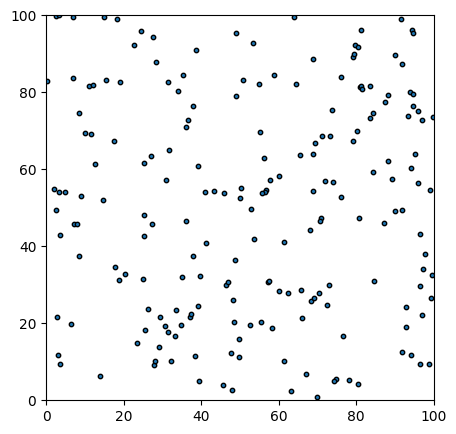

In [8]:
fig, axis = plt.subplots(figsize = (5, 5)) # 5x5 pulgadas
scatter = axis.scatter(all_positions.iloc[0][0][:,0], all_positions.iloc[0][0][:,1], s=10, edgecolor="k")
axis.axis([0, WIDTH, 0, HEIGHT])

def animate(i):
    scatter.set_offsets(all_positions.iloc[i][0])

anim = animation.FuncAnimation(fig, animate, frames = MAX_ITERATIONS)

In [9]:
anim